For the sytheses of Room Impulse Response (RIR), we use the stochastic model proposed by Jean-Dominique Polack in 1991 [https://www.sciencedirect.com/science/article/pii/0003682X9390054A]. This model devide the response into three parts, the direct received signal, the early reflected signals and the reverberations, as shown in *Fig. 1*. Direct received siganl is easy to obtained, only use time delay trick. So we mainly focus on how to obtain the early reflected siganls and reverbrations.

![RIR](https://jpecquais.github.io/doc-technique-son/_resources/drawings/reverb.svg)
*Figure. 1. Room Impulse Response*

**Source-Image Method**

Source-Image Method is first proposed by Jont B. Allen and David A. Berkley in 1979 [https://jontalle.web.engr.illinois.edu/Public/AllenBerkley79.pdf], which is used to calculate the reflection distance between the source and receiver. As for the energy attenuated during this propagation, it could mesured by
$$
dL = 20 \log(R_2/R_1)
$$
where $dL$ is difference in dB, $R_1,R_2$ are distance between source and receiver.

**Poisson Distribution**

Since we aim to define a general stochastic reverberation model, independent of the geometry of the room, we will consider that the positions of the source images are random and uniformly distributed. Under this assumption, the propagation of the sound wave and its reflection is a poisson process (both wave or image number and refletion times of a wave is a poisson process), so that it follows a Poisson distribution, i.e. the number of waves (images) $N$ at time $t$ has a probability of
$$
P(N, t) = \frac{\lambda^N(t)}{N!}e^{-\lambda (t)}
$$
where $N$ is the number of waves, given by
$$
\frac{dN}{dt} = \frac{4\pi c^3 t^2}{V} = \lambda(t)
$$
where $c$ is the speed of sound and $V$ is the volume of the room (under the hypothesis of a rectangular room).

Similarly, the reflection times of a wave $n$ has a probability of
$$
P(n) = \frac{\lambda^n}{n!}e^{-\lambda}
$$
where $\lambda$ is the average times of reflections, defined as
$$
\lambda = \frac{S c}{4V}t
$$
where $S$ is the surface of the walls of the room, $c$ is the speed of sound, $V$ is the volume of the room and $t$ is the time.

Therefore, $N \sim Poisson(\lambda_{ave\_num\_waves}(t))$ and $n \sim Poisson(\lambda_{ave\_reflx\_times})$. And the coefficient of reverberation for each time $t$ could be calculated by
$$
N \times n \times \alpha^n P(n)
$$ 
where $\alpha$ is the absorption coefficient of the walls.

In [100]:
import numpy as np
import math
import matplotlib.pyplot as plt
from scipy.stats import poisson
from scipy.io.wavfile import read
import os

import torch


# direct wave and early reflected signals

In [101]:
def calculate_distance(X0, X1):
    """
    Calculate the Euclidean distance between two points.
    input:
        X0: list of floats, the first point
        X1: list of floats, the second point
    output:
        float, the Euclidean distance between X0 and X1
    """
    dim = len(X0)
    return math.sqrt(sum([(X0[i] - X1[i]) ** 2 for i in range(dim)]))

In [102]:
def get_early_reflection_coeff(X0, X1, room_size):
    """
    Calculate the time delay and attenuation of early reflections.
    inputs:
        X0: list of floats, the source position
        X1: list of floats, the receiver position
        room_size: list of floats, the size of the room, assuming the room is a rectangular parallelepiped
    outputs:
        time_delay: list of floats, the time delay of the early reflections
        attenuation_linear: list of floats, the attenuation of the early reflections in linear scale
    """
    c0 = 340
    a, b, c = room_size

    dist = [] # dist[0] is the direct path, dist[1..6] are symmetric paths
    X0 = np.array(X0)
    A = np.array([[-1, 1, 1], [1, -1, 1], [1, 1, -1]])
    B = np.array([[0, 0, 0], [2*a, 0, 0], [0, 2*b, 0], [0, 0, 2*c]])
    dist.append(calculate_distance(X0, X1))
    dist.append(calculate_distance(A[0]*X0+B[0], X1))
    dist.append(calculate_distance(A[0]*X0+B[1], X1))
    dist.append(calculate_distance(A[1]*X0+B[0], X1))
    dist.append(calculate_distance(A[1]*X0+B[2], X1))
    dist.append(calculate_distance(A[2]*X0+B[0], X1))
    dist.append(calculate_distance(A[2]*X0+B[3], X1))

    fig = plt.figure(figsize=(7,7))
    ax = fig.add_subplot(111, projection='3d')

    corners = np.array([[0, 0, 0], [a, 0, 0], [a, b, 0], [0, b, 0],
                        [0, 0, c], [a, 0, c], [a, b, c], [0, b, c]])
    edges = [(0, 1), (1, 2), (2, 3), (3, 0), 
             (4, 5), (5, 6), (6, 7), (7, 4),
             (0, 4), (1, 5), (2, 6), (3, 7)] 

    for edge in edges:
        ax.plot3D(*zip(*corners[list(edge)]), color='black')

    ax.scatter(*X0, color='red', s=50, label="Source (X0)")
    ax.scatter(*X1, color='blue', s=50, label="Receiver (X1)")

    ax.plot3D(*zip(X0, X1), color='green', linestyle='--', label="Direct path")
    mirror_paths = [
        (A[0]*X0 + B[0], "Reflection (Wall x=0)"),
        (A[0]*X0 + B[1], "Reflection (Wall x=a)"),
        (A[1]*X0 + B[0], "Reflection (Wall y=0)"),
        (A[1]*X0 + B[2], "Reflection (Wall y=b)"),
        (A[2]*X0 + B[0], "Reflection (Wall z=0)"),
        (A[2]*X0 + B[3], "Reflection (Wall z=c)"),
    ]

    for mirror, label in mirror_paths:
        ax.scatter(*mirror, color='orange', s=30, alpha=0.7)  # 绘制镜像点
        ax.plot3D(*zip(X1, mirror), linestyle='--', alpha=0.5, color='gray')  # 从镜像点到接收点

    ax.legend()
    ax.set_xlim(0, a)
    ax.set_ylim(0, b)
    ax.set_zlim(0, c)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.grid(False)
    plt.title("3D Visualization of Sound Reflections")
    plt.savefig("3D Visualization of Sound Reflections.pdf")
    plt.show()


    attenuation_dB = []
    for d in dist:
        attenuation_dB.append(20 * math.log10(d/dist[0]))
    attenuation_linear = [10 ** (-attenuation_dB[i]/20) for i in range(len(attenuation_dB))]

    time_delay = [dist[i]/c0 for i in range(len(dist))]
    return time_delay, attenuation_linear

# reverb by using stochastic model

In [103]:
def get_average_number_of_images(t, V):
    """
    get the average number of images for a given time and volume, i.e. lambda(t)
    input:
        t: time in seconds
        V: volume of room in m^3
    output:
        lambda(t): average number of images
    """
    c0 = 340
    return 4 * np.pi * c0**3 * t**2 / V

def get_average_reflection_time(t, V, S):
    """
    get the average reflection time for a given time, volume and surface area, i.e. lambda
    input:
        t: time in seconds
        V: volume of room in m^3
        S: surface area of room in m^2
    output:
        lambda: average reflection time
    """
    c0 = 340
    return S * c0 * t / (4 * V)

In [150]:
def get_reverb_coeff(time_scale, V, S, alpha=0.3):
    """
    get the reverb coefficient for a given time, volume, surface area and absorption coefficient
    input:
        time_scale: list like, time scale in seconds
        V: volume of room in m^3
        S: surface area of room in m^2
        alpha: absorption coefficient
    output:
        reverb: reverb coefficient
    notice:
        time_scale should start from mixing time (> 0)
    """
    attenuation_linear = []
    for t in time_scale:
        lmbda1 = get_average_number_of_images(t, V)
        N = poisson.rvs(lmbda1)
        lmbda = get_average_reflection_time(t, V, S)
        n = poisson.rvs(lmbda)
        p_n = poisson.pmf(n, lmbda)
        attenuation_linear.append(N * (alpha)**n * p_n)
    return attenuation_linear


# Synthesis

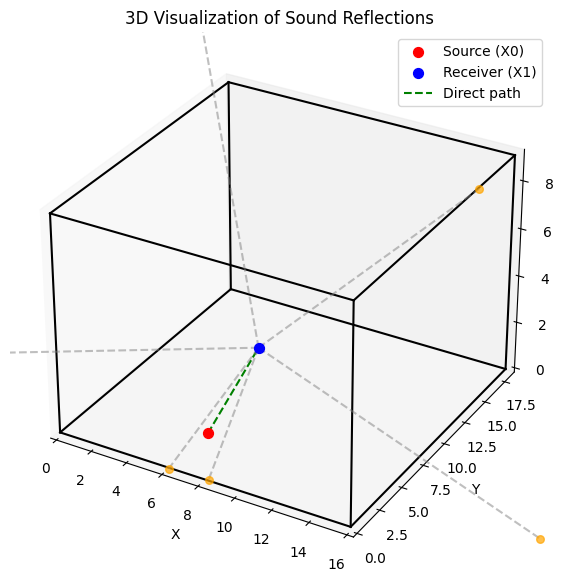

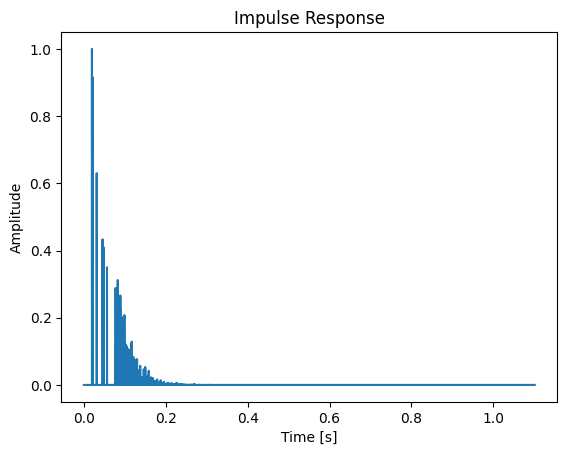

In [151]:
# define the room size
room_size = [16.01, 18.359, 9.1] # in [m]
# define the source and receiver positions
X0 = [7.3, 2, 1] # source position, in [m]
X1 = [6.71, 8.6, 2.181] # receiver position, in [m]
S = 1083.302749999
V = 2067.057664100000
alpha = 0.3 # absorption coefficient

Fs = 48000


# calculate the time delay and attenuation of early reflections
time_delay, attenuation_reflx = get_early_reflection_coeff(X0, X1, room_size)

# use RT60 as the mixing time
RT60 = 0.161 * V / (alpha * S)
start_time = np.max(time_delay) + RT60
time_scale = np.arange(0, start_time, 1/Fs) # impulse response time scale (1 second)
# calculate the reverb coefficient
attenuation_reverb = get_reverb_coeff(time_scale[int(0.3*Fs):], V, S, alpha)

# combine the early reflections and reverb
response = np.zeros(len(time_scale))
for i in range(len(time_delay)):
    response[int(time_delay[i]*Fs)+1] = attenuation_reflx[i]

# Here we assume the reverb starts from 0.1s
start_time = np.max(time_delay)
for i in range(len(attenuation_reverb)):
    response[int(start_time*Fs)+i] = attenuation_reverb[i]

# plot the impulse response
plt.plot(time_scale, response)
plt.title('Impulse Response')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
# save figure as pdf
plt.savefig('impulse_response.pdf')
plt.show()

In [152]:
audio_path = 'Enregistrement_salle/'
audio_name = 'TP_UPMC_RAYSALSO.wav'
full_path = os.path.join(audio_path, audio_name)

Fs, signal = read(full_path)
signal = signal / np.max(signal)
signal = signal.T

# use Pytorch to speed up the convolution
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

outputs = []

# convolve the impulse response with the audio signal
if device == 'cpu':
    signal = signal[:, :3 * Fs]
    outputs.append(np.convolve(signal[0], response, mode='full'))
    outputs.append(np.convolve(signal[1], response, mode='full'))
else:
    signal_tensor_0 = torch.tensor(signal[0], dtype=torch.float32).to('cuda')
    signal_tensor_1 = torch.tensor(signal[1], dtype=torch.float32).to('cuda')
    response_tensor = torch.tensor(response, dtype=torch.float32).to('cuda')

    outputs = []
    outputs.append(torch.nn.functional.conv1d(signal_tensor_0.unsqueeze(0).unsqueeze(0), response_tensor.unsqueeze(0).unsqueeze(0), padding=0).squeeze().cpu().numpy())
    outputs.append(torch.nn.functional.conv1d(signal_tensor_1.unsqueeze(0).unsqueeze(0), response_tensor.unsqueeze(0).unsqueeze(0), padding=0).squeeze().cpu().numpy())

In [155]:
from IPython.display import Audio

outputs = outputs / np.max(outputs)
outputs = outputs * 10**(-0.1/20)
Audio(outputs, rate=Fs)

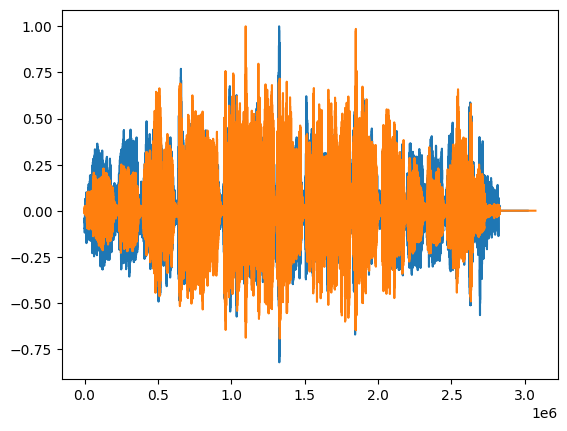

In [157]:
audio_path = 'Enregistrement_salle/'
audio_name = 'TP_UPMC_RAYSALSO Micro2_gauche_AB_5.69.wav'
full_path = os.path.join(audio_path, audio_name)

Fs, signal = read(full_path)
signal = signal / np.max(signal)
signal = signal.T

plt.figure()
plt.plot(outputs[0]/np.max(outputs[0]))
plt.plot(signal[0])
plt.show()